# ClimateNet AR/TC Analysis: Animations

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cftime
import matplotlib.colors 
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point

In [2]:
# Import dask
import dask

# Use dask jobqueue
from dask_jobqueue import PBSCluster

# Import a client
from dask.distributed import Client

# Setup your PBSCluster
nmem1 = '5GiB' # PBSCluster specification
nmem2 = '5GB' # pbs specification
cluster = PBSCluster(
    cores=1, # The number of cores you want
    memory=nmem1, # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='/glade/scratch/kdagon/dask-local', # Use your local directory
    resource_spec='select=1:ncpus=1:mem='+nmem2, # Specify resources
    account='P06010014', # Input your project ID here
    walltime='01:00:00', # Amount of wall time
    interface='ib0', # Interface to use
)

# Scale up -- how to determine this number?
cluster.scale(10)

# Change your url to the dask dashboard so you can see it
dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'})
# the above is for jupyterhub only, otherwise use /proxy/{port}/status (also need to launch ssh tunneling from the appropriate environment)
#dask.config.set({'distributed.dashboard.link': "/proxy/{port}/status"})
# really I should set these options in some sort of config file...

# Setup your client
client = Client(cluster)

In [3]:
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.45:43327,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [4]:
#file_path = "/glade/campaign/cgd/amp/jet/ClimateNet/" # pretrained LBL model, 2000-2005
#file_path = "/glade/campaign/cgd/ccr/kdagon/cgnet/" # retrained NCAR model, 2000-2006, before means/std bug fix
#file_path = "/glade/p/cgd/ccr/people/tking/cgnet_masks/" # retrained NCAR model, 2000-2015, after means/std bug fix
#file_path = "/glade/scratch/tking/" # testing TMQ-only config file

file_path = "/glade/campaign/cgd/ccr/kdagon/cgnet/" # retrained NCAR model, after data processing workflow was finalized

In [ ]:
# LBL pre-trained model run on CESM output (4 inputs: TMQ, PSL, U850, V850)
#LBL_year_folder = "output.cgnet.2000/"

# NCAR re-trained model, before means/std bug fix
#cesm_cnet_folder = "results.2000/"
# NCAR re-trained model, after means/std bug fix
#cesm_cnet_folder = "tmq_psl_v850_u850/"
#cesm_cnet_folder = "tmq_v850/actual_tmq_v850_masks/"
#cesm_cnet_folder = "tmq_only/actual_tmq_only_masks/"

In [ ]:
#date_glob = "*547[7-8]*.nc" # trying to read in ~3-4 weeks around end of January (noting the time convention may be wrong here)
#date_glob = "b.e13.B20TRC5CN.ne120_g16.003*.nc" # all the files in the folder

cnet_files = "class_masks*.nc"
#cnet_files = "class_masks.2000.test.nc"

In [ ]:
#output = xr.open_mfdataset(file_path+LBL_year_folder+date_glob, combine='by_coords') # returns time in datetime64
#output = xr.open_mfdataset(file_path+LBL_year_folder+date_glob, combine='by_coords', decode_cf=False) # returns time in days since 1850-01-01 00:00:00
#output = xr.open_mfdataset(file_path+LBL_year_folder+date_glob, combine='by_coords', use_cftime=True) # returns time in cftime.DatetimeGregorian

output = xr.open_mfdataset(file_path+cesm_cnet_folder+cnet_files, concat_dim='time', combine='nested', chunks={'time':50}, parallel=True)

## CESM historical & RCP2.6 simulations

In [ ]:
#cnet_files = "b.e13.B20TRC5CN.ne120_g16.003*.nc" # pretrained LBL model
#cnet_files = "class_masks*.nc" # retrained NCAR model
#cnet_files = "class_masks.200[0-5]*" # testing years 2000-2005

hist_yrs = [str(i) for i in range(2000,2006)]
hist_folders = ["B20TRC5CN/"+y+"/masks/" for y in hist_yrs]

rcp26_yrs = [str(i) for i in range(2006,2016)]
rcp26_folders = ["BRCP26C5CN/"+y+"/masks/" for y in rcp26_yrs]

cnet_folders = hist_folders+rcp26_folders
#cnet_folders

cnet_files = "class_masks*.nc"

In [ ]:
%%time
# read in all the masks
# adjust chunks for length of timeseries data
#cnet = [xr.open_mfdataset(cesm_cnet_filepath+cesm_cnet_folders[i]+cnet_files, concat_dim='time',combine='nested', chunks={'time':50}, parallel=True) for i,f in enumerate(cesm_cnet_folders)]
cnet = [xr.open_mfdataset(file_path+cnet_folders[i]+cnet_files, concat_dim='time',combine='nested', chunks={'time':50}, parallel=True) for i,f in enumerate(cnet_folders)]

# concat across time
cnet_concat = xr.concat(cnet,dim='time')

## CESM RCP8.5 simulations

In [6]:
rcp85_yrs = [str(i) for i in range(2086,2101)]
cnet_folders = ["BRCP85C5CN/"+y+"/masks/" for y in rcp85_yrs]

cnet_files = "class_masks*.nc"

In [7]:
cnet_folders

['BRCP85C5CN/2086/masks/',
 'BRCP85C5CN/2087/masks/',
 'BRCP85C5CN/2088/masks/',
 'BRCP85C5CN/2089/masks/',
 'BRCP85C5CN/2090/masks/',
 'BRCP85C5CN/2091/masks/',
 'BRCP85C5CN/2092/masks/',
 'BRCP85C5CN/2093/masks/',
 'BRCP85C5CN/2094/masks/',
 'BRCP85C5CN/2095/masks/',
 'BRCP85C5CN/2096/masks/',
 'BRCP85C5CN/2097/masks/',
 'BRCP85C5CN/2098/masks/',
 'BRCP85C5CN/2099/masks/',
 'BRCP85C5CN/2100/masks/']

In [8]:
%%time
# read in all the masks
# adjust chunks for length of timeseries data
#cnet = [xr.open_mfdataset(file_path+cnet_folders[i]+cnet_files, concat_dim='time',combine='nested', chunks={'time':50}, parallel=True) for i,f in enumerate(cnet_folders)]

# concat across time
#cnet_concat = xr.concat(cnet,dim='time')

# read in a single year
cnet = xr.open_mfdataset(file_path+cnet_folders[0]+cnet_files, concat_dim='time',combine='nested', chunks={'time':50}, parallel=True)

CPU times: user 537 ms, sys: 236 ms, total: 773 ms
Wall time: 5.82 s


In [9]:
cnet

<xarray.Dataset>
Dimensions:  (lon: 1152, lat: 768, time: 2920)
Coordinates:
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * time     (time) object 2086-01-01 00:00:00 ... 2086-12-31 21:00:00
Data variables:
    masks    (time, lat, lon) int64 dask.array<chunksize=(50, 768, 1152), meta=np.ndarray>

In [10]:
cnet.time # check the dates

<xarray.DataArray 'time' (time: 2920)>
array([cftime.DatetimeNoLeap(2086, 1, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2086, 1, 1, 3, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2086, 1, 1, 6, 0, 0, 0, has_year_zero=True), ...,
       cftime.DatetimeNoLeap(2086, 12, 31, 15, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2086, 12, 31, 18, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2086, 12, 31, 21, 0, 0, 0, has_year_zero=True)],
      dtype=object)
Coordinates:
  * time     (time) object 2086-01-01 00:00:00 ... 2086-12-31 21:00:00
Attributes:
    standard_name:  time
    long_name:      time
    bounds:         time_bnds
    axis:           T

In [13]:
cnet.masks

<xarray.DataArray 'masks' (time: 2920, lat: 768, lon: 1152)>
dask.array<open_dataset-03e2690438ca94f5eefb336e00dd115amasks, shape=(2920, 768, 1152), dtype=int64, chunksize=(50, 768, 1152), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * time     (time) object 2086-01-01 00:00:00 ... 2086-12-31 21:00:00
Attributes: (12/23)
    CDI:                        Climate Data Interface version 2.0.2 (https:/...
    Conventions:                CF-1.0
    source:                     CAM
    history:                    Mon Feb 20 14:02:32 2023: cdo splitsel,1 2086...
    remap_script:               ncremap
    remap_command:              '/glade/u/apps/dav/opt/nco/4.7.9/gnu/8.3.0/bi...
    ...                         ...
    host:                       nid02781
    Version:                    $Name$
    revision_Id:                $Id$
    initial_file:               /global/project/projectdirs/ccsm1/inputdata/a...
    topography_file:            /global/project/projectdirs/ccsm1/inputdata/a...
    CDO:                        Climate Data Operators version 2.0.1 (https:/...

In [16]:
# how to select the first month of RCP8.5
cnet.masks.sel(time=slice("2086-01-01","2086-01-31"))

<xarray.DataArray 'masks' (time: 248, lat: 768, lon: 1152)>
dask.array<getitem, shape=(248, 768, 1152), dtype=int64, chunksize=(50, 768, 1152), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * time     (time) object 2086-01-01 00:00:00 ... 2086-01-31 21:00:00
Attributes: (12/23)
    CDI:                        Climate Data Interface version 2.0.2 (https:/...
    Conventions:                CF-1.0
    source:                     CAM
    history:                    Mon Feb 20 14:02:32 2023: cdo splitsel,1 2086...
    remap_script:               ncremap
    remap_command:              '/glade/u/apps/dav/opt/nco/4.7.9/gnu/8.3.0/bi...
    ...                         ...
    host:                       nid02781
    Version:                    $Name$
    revision_Id:                $Id$
    initial_file:               /global/project/projectdirs/ccsm1/inputdata/a...
    topography_file:            /global/project/projectdirs/ccsm1/inputdata/a...
    CDO:                        Climate Data Operators version 2.0.1 (https:/...

In [18]:
cnet_animate = cnet.masks.sel(time=slice("2086-01-01","2086-01-31"))
cnet_animate

<xarray.DataArray 'masks' (time: 248, lat: 768, lon: 1152)>
dask.array<getitem, shape=(248, 768, 1152), dtype=int64, chunksize=(50, 768, 1152), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * time     (time) object 2086-01-01 00:00:00 ... 2086-01-31 21:00:00
Attributes: (12/23)
    CDI:                        Climate Data Interface version 2.0.2 (https:/...
    Conventions:                CF-1.0
    source:                     CAM
    history:                    Mon Feb 20 14:02:32 2023: cdo splitsel,1 2086...
    remap_script:               ncremap
    remap_command:              '/glade/u/apps/dav/opt/nco/4.7.9/gnu/8.3.0/bi...
    ...                         ...
    host:                       nid02781
    Version:                    $Name$
    revision_Id:                $Id$
    initial_file:               /global/project/projectdirs/ccsm1/inputdata/a...
    topography_file:            /global/project/projectdirs/ccsm1/inputdata/a...
    CDO:                        Climate Data Operators version 2.0.1 (https:/...

In [11]:
# trial and error to match the original time indices for animation...
cnet_animate = cnet_mask.isel(time=slice(119,295))

In [12]:
print(cnet_animate.time.min(), cnet_animate.time.max())

<xarray.DataArray 'time' ()>
array(cftime.DatetimeNoLeap(2000, 1, 16, 0, 0, 0, 0, has_year_zero=True),
      dtype=object) <xarray.DataArray 'time' ()>
array(cftime.DatetimeNoLeap(2000, 2, 6, 21, 0, 0, 0, has_year_zero=True),
      dtype=object)


## Make the animation

In [17]:
#cmap_all = matplotlib.colors.ListedColormap(['w', 'green', 'red'])
cmap_all = matplotlib.colors.ListedColormap(['w', 'blue', 'orange']) #more colorblind friendly colors
bounds = [0, 0.99, 1.99, 2.99]
#norm = matplotlib.colors.BoundaryNorm(bounds, cmap_all.N)

### Test plot of the first time index

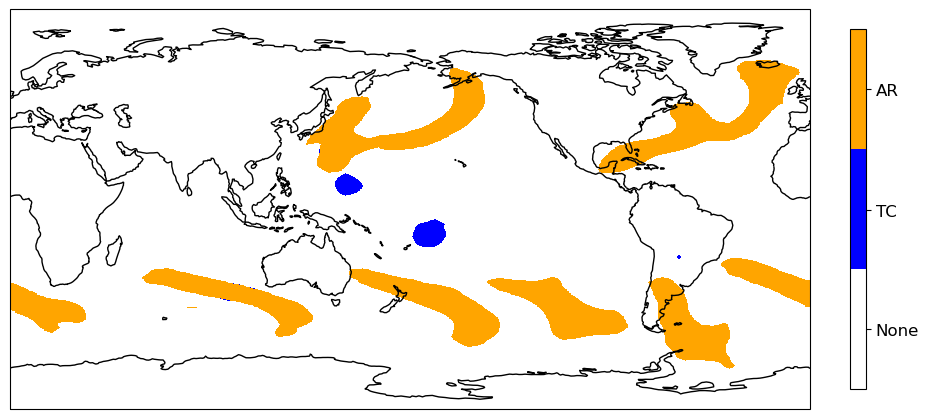

In [19]:
fig = plt.figure(figsize=(8,6))

ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0)) # shift map center to highlight Pacific

lat = cnet_animate.lat
lon = cnet_animate.lon
#cf = ax.contourf(lon, lat, cnet_animate[0,:,:], cmap=cmap_all, vmin=0, vmax=2.99, levels=bounds, transform=ccrs.PlateCarree())
pc = ax.pcolormesh(lon, lat, cnet_animate.isel(time=0), cmap=cmap_all, vmin=0, vmax=2.99, transform=ccrs.PlateCarree()) # get rid of edge colors

ax.coastlines()

import matplotlib as mpl
cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all,
                                norm=norm,
                                orientation='vertical', 
                               ticks=bounds)
labels = np.array([0, 0.99, 1.99])
loc    = labels + .5
tick_1 = ['None','TC','AR']
cb1.set_ticks(loc)
cb1.ax.set_yticklabels(tick_1)
cb1.ax.tick_params(labelsize=12)

### Create the animation

In [20]:
# Persisting cnet_animate to help with speed? Try .compute? Need more background mem in notebook?
cnet_animate = cnet_animate.persist()

In [21]:
len(cnet_animate)

248

In [25]:
# what is slowing this down?
dask.visualize(cnet_animate)

RuntimeError: No visualization engine detected, please install graphviz or ipycytoscape

KeyboardInterrupt: 

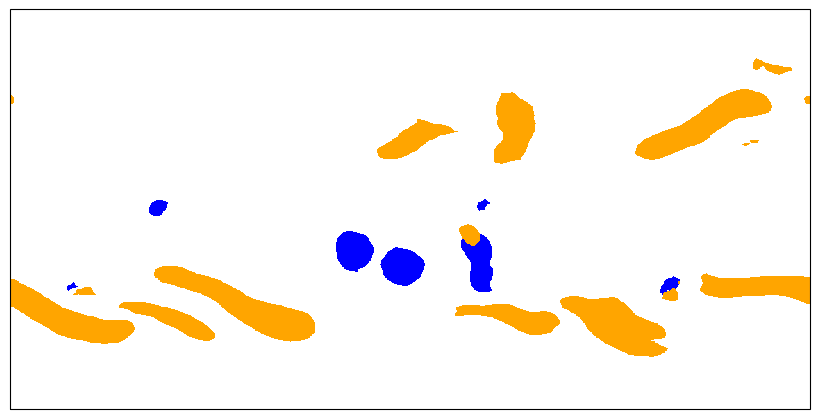

In [22]:
for counter, ind in enumerate(np.arange(0,len(cnet_animate))):
    
    iterate = "{:03d}".format(counter) # modify significant digits depends on length of files

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0))
    
    lat = cnet_animate.lat
    lon = cnet_animate.lon
    pc = ax.pcolormesh(lon, lat, cnet_animate.isel(time=ind), cmap=cmap_all, vmin=0, vmax=2.99, transform=ccrs.PlateCarree()) 
    
    ax.coastlines()
    
    import matplotlib as mpl
    cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
    norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
    cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all,
                                norm=norm,
                                orientation='vertical', 
                               ticks=bounds)
    labels = np.array([0, 0.99, 1.99])
    loc    = labels + .5
    tick_1 = ['None','TC','AR']
    cb1.set_ticks(loc)
    cb1.ax.set_yticklabels(tick_1)
    cb1.ax.tick_params(labelsize=12)
    
    # clear out existing .png files before running this?
    plt.savefig(f'../figures/climatenet/climatenet_animation/climatenet_2086_{iterate}.png', bbox_inches='tight', dpi=200)
    #plt.show()
    plt.close()

In [23]:
# check number of indices
iterate

'208'

In [27]:
cnet_animate.isel(time=207).time

<xarray.DataArray 'time' ()>
array(cftime.DatetimeNoLeap(2086, 1, 26, 21, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time     object 2086-01-26 21:00:00
Attributes:
    standard_name:  time
    long_name:      time
    bounds:         time_bnds
    axis:           T

In [28]:
import subprocess

def grid2gif(image_str, output_gif):
    str1 = 'convert -delay 8 -loop 0 ' + image_str  + ' ' + output_gif
    subprocess.call(str1, shell=True)

# REPLACE END INDEX WITH VALUE OF iterate
# LBL pre-trained
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet_2000-01-21-3z_2000-02-10-0z.gif")
# NCAR re-trained 4 channels
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet-NCAR4ch_2000-01-21-3z_2000-02-10-0z.gif")
# NCAR re-trained 1 channel
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet-NCAR1ch_2000-01-21-3z_2000-02-10-0z.gif")
# LBL pre-trained; Re-do with better colors
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet_updateColors_2000-01-21-3z_2000-02-10-0z.gif")
# NCAR re-trained, before means/std bug fix
#grid2gif("../figures/climatenet/climatenet_animation/climatenet_2000_{000..175}.png", "../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_beforebugfix.gif")
# NCAR re-trained, after means/std bug fix
#grid2gif("../figures/climatenet/climatenet_animation/climatenet_2000_{000..175}.png", "../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_afterbugfix.gif")
# NCAR re-trained, before config file bug fix
#grid2gif("../figures/climatenet/climatenet_animation/climatenet_2000_{000..175}.png", "../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_tmq-v850_beforeconfigfix.gif")
#grid2gif("../figures/climatenet/climatenet_animation/climatenet_2000_{000..175}.png", "../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_tmq-only_beforeconfigfix.gif")
# NCAR re-trained, after config file bug fix
#grid2gif("../figures/climatenet/climatenet_animation/climatenet_2000_{000..175}.png", "../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_tmq-only_testconfig.gif")
# RCP8.5 2086 first month (debugging zero detection)
grid2gif("../figures/climatenet/climatenet_animation/climatenet_2086_{000..207}.png", "../figures/climatenet/climatenet_animation/climatenet_2086-01-01-0z_2000-01-26-21z.gif")


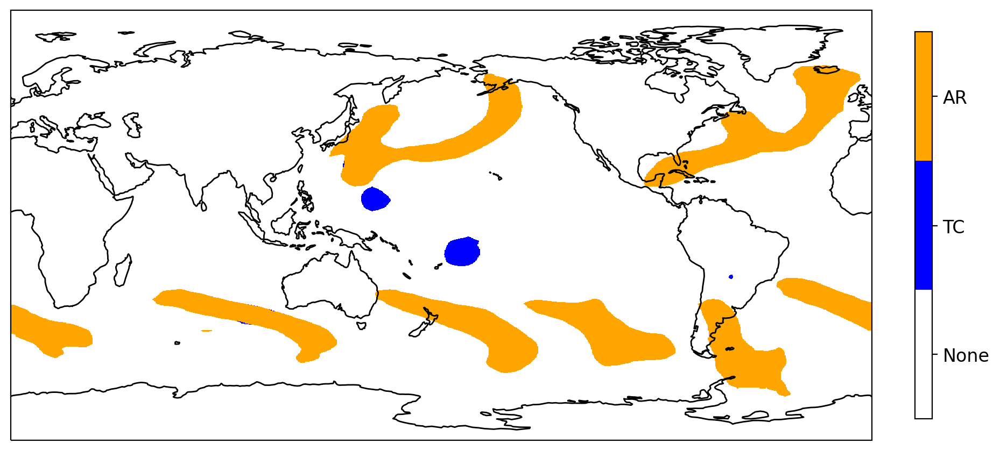

In [30]:
def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

#show_gif('../figures/climatenet_animation/climatenet_2000-01-21-3z_2000-02-10-0z.gif')
#show_gif('../figures/climatenet_animation/climatenet-NCAR4ch_2000-01-21-3z_2000-02-10-0z.gif')
#show_gif('../figures/climatenet_animation/climatenet-NCAR1ch_2000-01-21-3z_2000-02-10-0z.gif')
#show_gif('../figures/climatenet_animation/climatenet_updateColors_2000-01-21-3z_2000-02-10-0z.gif')
#show_gif('../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_beforebugfix.gif')
#show_gif('../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_afterbugfix.gif')
#show_gif('../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_tmq-only_beforeconfigfix.gif')
#show_gif('../figures/climatenet/climatenet_animation/climatenet_2000-01-16-0z_2000-02-06-21z_tmq-only_testconfig.gif')
show_gif('../figures/climatenet/climatenet_animation/climatenet_2086-01-01-0z_2000-01-26-21z.gif')

### Static plot of a specific time point

In [95]:
# select time index - noting that these are offset due to calendar issue in netcdf files
#t = '2000-07-05T12'
t = '2000-02-01T00'

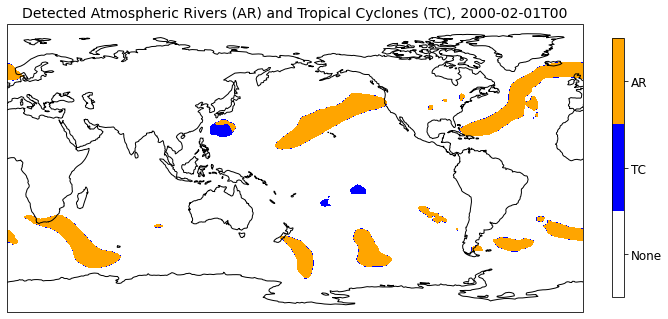

In [101]:
fig = plt.figure(figsize=(8,6))

ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0)) # shift map center to highlight Pacific

lat = output_tag.lat
lon = output_tag.lon
cf = ax.contourf(lon, lat, output_tag.sel(time=t)[0], cmap=cmap_all, vmin=0, vmax=2.99, levels=bounds, transform=ccrs.PlateCarree())

ax.coastlines()

import matplotlib as mpl
cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all,
                                norm=norm,
                                orientation='vertical', 
                               ticks=bounds)
labels = np.array([0, 0.99, 1.99])
loc    = labels + .5
tick_1 = ['None','TC','AR']
cb1.set_ticks(loc)
cb1.ax.set_yticklabels(tick_1)
cb1.ax.tick_params(labelsize=12)

ax.set_title('Detected Atmospheric Rivers (AR) and Tropical Cyclones (TC), '+t, fontsize=14);

#plt.savefig('climatenet_'+t, bbox_inches='tight')
#plt.savefig('climatenet_'+t+'.pdf', bbox_inches='tight') # this throws some warnings (doesn't like the file extension added?)